In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Switch to the project working directory

In [ ]:
%cd /content/drive/MyDrive/adversarial-yolo/
%ls

/content/drive/MyDrive/adversarial-yolo
 adversarial_examples.ipynb   image.py             __pycache__/
 batch_detect.py              inria/               pytorch041_cuda92_colab.sh
 batch_rotate.py              inria.tar            README.md
 cfg/                         layers/              recall.py
 cfg.py                       LICENSE              region_loss.py
 class_only.json              load_data.py         run_docker.sh
 class_shift.json             median_pool.py       runs/
 clean_results.json           models/              saved_patches/
 craft_adv.py                 noise_results.json   scripts/
 darknet.py                   non_printability/    test/
 data/                       'oude versies'/       test_patch.py
 dataset.py                   partial.py           tools/
 debug.py                     patch_config.py      train_patch.py
 demo.py                      patches/             train.py
 detect.py                    patch.jpg            up_results.json
 DGXConta

In [ ]:
!git clone https://gitlab.com/EAVISE/adversarial-yolo.git

Cloning into 'adversarial-yolo'...
remote: Enumerating objects: 1058, done.
remote: Total 1058 (delta 0), reused 0 (delta 0), pack-reused 1058
Receiving objects: 100% (1058/1058), 93.21 MiB | 11.65 MiB/s, done.
Resolving deltas: 100% (79/79), done.
You can inspect what was checked out with 'git status'
and retry the checkout with 'git checkout -f HEAD'

^C


In [ ]:
%cd adversarial-yolo/
%ls

/content/drive/MyDrive/adversarial-yolo
 adversarial_examples.ipynb   image.py             __pycache__/
 batch_detect.py              inria/               pytorch041_cuda92_colab.sh
 batch_rotate.py              inria.tar            README.md
 cfg/                         layers/              recall.py
 cfg.py                       LICENSE              region_loss.py
 class_only.json              load_data.py         run_docker.sh
 class_shift.json             median_pool.py       runs/
 clean_results.json           models/              saved_patches/
 craft_adv.py                 noise_results.json   scripts/
 darknet.py                   non_printability/    test/
 data/                       'oude versies'/       test_patch.py
 dataset.py                   partial.py           tools/
 debug.py                     patch_config.py      train_patch.py
 demo.py                      patches/             train.py
 detect.py                    patch.jpg            up_results.json
 DGXConta

Install packages that you need here

In [ ]:
!pip3 install tensorboardX
!pip3 install darknet

In [ ]:
# drive.mount('/content/drive/MyDrive/SeniorYear/569/vehicle_lab/')
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).



### (1) Detect without patch
Utilize the apis in detect.py to recognize images of people. Feel free to edit the source code if it’s needed. The result should be plotted after running the code.



In [ ]:
# Your code starts here
# Hint: To directly run the main function in a file, use 
# cd
%run detect.py cfg/yolov2.cfg weights/yolo.weights test/img/crop001024.png

layer     filters    size              input                output
    0 conv     32  3 x 3 / 1   608 x 608 x   3   ->   608 x 608 x  32
    1 max          2 x 2 / 2   608 x 608 x  32   ->   304 x 304 x  32
    2 conv     64  3 x 3 / 1   304 x 304 x  32   ->   304 x 304 x  64
    3 max          2 x 2 / 2   304 x 304 x  64   ->   152 x 152 x  64
    4 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128
    5 conv     64  1 x 1 / 1   152 x 152 x 128   ->   152 x 152 x  64
    6 conv    128  3 x 3 / 1   152 x 152 x  64   ->   152 x 152 x 128
    7 max          2 x 2 / 2   152 x 152 x 128   ->    76 x  76 x 128
    8 conv    256  3 x 3 / 1    76 x  76 x 128   ->    76 x  76 x 256
    9 conv    128  1 x 1 / 1    76 x  76 x 256   ->    76 x  76 x 128
   10 conv    256  3 x 3 / 1    76 x  76 x 128   ->    76 x  76 x 256
   11 max          2 x 2 / 2    76 x  76 x 256   ->    38 x  38 x 256
   12 conv    512  3 x 3 / 1    38 x  38 x 256   ->    38 x  38 x 512
   13 conv    256  1 x 

/content/drive/My Drive/adversarial-yolo/utils.py:146: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  cls_confs = torch.nn.Softmax()(Variable(output[5:5+num_classes].transpose(0,1))).data


torch.Size([1805, 80])
test/img/crop001024.png: Predicted in 0.298874 seconds.
[0]person: 0.999792
[24]backpack: 0.999135
save plot results to predictions.jpg


In [ ]:
mkdir weights; curl https://pjreddie.com/media/files/yolov2.weights -o weights/yolo.weights

mkdir: cannot create directory ‘weights’: File exists
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  194M  100  194M    0     0  41.7M      0  0:00:04  0:00:04 --:--:-- 43.5M


In [ ]:
!curl ftp://ftp.inrialpes.fr/pub/lear/douze/data/INRIAPerson.tar -o inria.tar
!tar xf inria.tar

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  969M  100  969M    0     0  9094k      0  0:01:49  0:01:49 --:--:-- 14.0M


In [ ]:
mv INRIAPerson inria

In [ ]:
cp -r yolo-labels inria/Train/pos/

In [ ]:
ls

 adversarial_examples.ipynb   image.py             __pycache__/
 batch_detect.py              inria/               pytorch041_cuda92_colab.sh
 batch_rotate.py              inria.tar            README.md
 cfg/                         layers/              recall.py
 cfg.py                       LICENSE              region_loss.py
 class_only.json              load_data.py         run_docker.sh
 class_shift.json             median_pool.py       runs/
 clean_results.json           models/              saved_patches/
 craft_adv.py                 noise_results.json   scripts/
 darknet.py                   non_printability/    test/
 data/                       'oude versies'/       test_patch.py
 dataset.py                   partial.py           tools/
 debug.py                     patch_config.py      train_patch.py
 demo.py                      patches/             train.py
 detect.py                    patch.jpg            up_results.json
 DGXContainer/                patch_results.json 

### (2) Train patches
Now we will train two patches by ourselves. One of the patches has a starter image as input and the other one is completely generated by our code. To do these, please 


*   Take a look at train_patch.py and edit the relevant code.
*   Write a wrapped-up api for generating these two kinds of patches.
*   Call the api to generate a with-starter-image patch and a without-starter-image patch.

Please make sure to save these images since you need to use them in the next step.

In [ ]:
def patch_training_caller(starter_img, ...):
  # Your code starts here
  

SyntaxError: ignored

starting test read
img read!
One epoch is 31


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 10 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Running epoch 0:   0%|          | 0/31 [00:00<?, ?it/s]/content/drive/MyDrive/adversarial-yolo/train_patch.py:84: UserWarning: Anomaly Detection has been enabled. This mode will increase the runtime and should only be enabled for debugging.
  with autograd.detect_anomaly():
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4066: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of gri

Running epoch 0: 100%|██████████| 31/31 [01:23<00:00,  2.71s/it]


  EPOCH NR:  0
EPOCH LOSS:  tensor(0.9018, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6339748367186515
  NPS LOSS:  0.000359183065630796
   TV LOSS:  0.2668861386276061
EPOCH TIME:  84.36967158317566


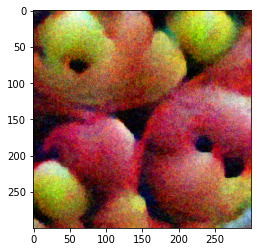

Running epoch 1: 100%|██████████| 31/31 [01:08<00:00,  1.69s/it]

Running epoch 1: 100%|██████████| 31/31 [01:08<00:00,  2.22s/it]


  EPOCH NR:  1
EPOCH LOSS:  tensor(0.9637, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6175491079207389
  NPS LOSS:  0.00044432197107873377
   TV LOSS:  0.34572387510730374
EPOCH TIME:  69.22626972198486


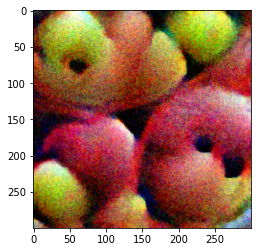

Running epoch 2: 100%|██████████| 31/31 [01:08<00:00,  1.69s/it]

Running epoch 2: 100%|██████████| 31/31 [01:08<00:00,  2.22s/it]


  EPOCH NR:  2
EPOCH LOSS:  tensor(0.9676, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6057860226400437
  NPS LOSS:  0.0004774087264517983
   TV LOSS:  0.36134735518886196
EPOCH TIME:  69.21024560928345


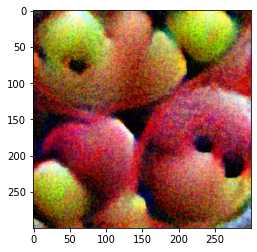

Running epoch 3: 100%|██████████| 31/31 [01:08<00:00,  1.70s/it]

Running epoch 3: 100%|██████████| 31/31 [01:08<00:00,  2.23s/it]

  EPOCH NR:  3
EPOCH LOSS:  tensor(0.9692, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5995344058159859
  NPS LOSS:  0.0005022514265991988
   TV LOSS:  0.3692114843476203
EPOCH TIME:  69.40628004074097


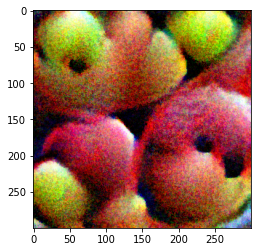

Running epoch 4: 100%|██████████| 31/31 [01:08<00:00,  1.68s/it]

Running epoch 4: 100%|██████████| 31/31 [01:08<00:00,  2.21s/it]


  EPOCH NR:  4
EPOCH LOSS:  tensor(0.9488, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5927329063415527
  NPS LOSS:  0.0005145574424175486
   TV LOSS:  0.355555857381513
EPOCH TIME:  68.90479969978333


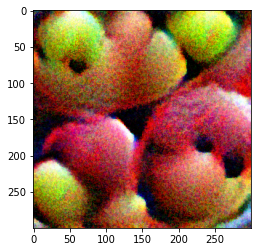

Running epoch 5: 100%|██████████| 31/31 [01:08<00:00,  1.69s/it]

Running epoch 5: 100%|██████████| 31/31 [01:09<00:00,  2.23s/it]


  EPOCH NR:  5
EPOCH LOSS:  tensor(0.9464, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5875583790963695
  NPS LOSS:  0.0005297718659764336
   TV LOSS:  0.3582638838598805
EPOCH TIME:  69.65892815589905


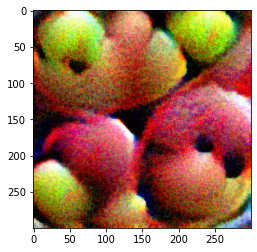

Running epoch 6: 100%|██████████| 31/31 [01:08<00:00,  1.69s/it]

Running epoch 6: 100%|██████████| 31/31 [01:08<00:00,  2.21s/it]


  EPOCH NR:  6
EPOCH LOSS:  tensor(0.9252, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5888812292006708
  NPS LOSS:  0.0005381787402345048
   TV LOSS:  0.33582196793248575
EPOCH TIME:  68.8466546535492


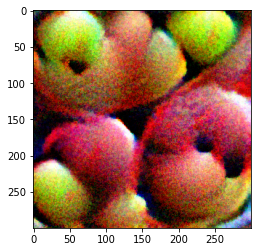

Running epoch 7: 100%|██████████| 31/31 [01:08<00:00,  1.70s/it]

Running epoch 7: 100%|██████████| 31/31 [01:09<00:00,  2.23s/it]


  EPOCH NR:  7
EPOCH LOSS:  tensor(0.9097, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.580657878229695
  NPS LOSS:  0.0005468428134918213
   TV LOSS:  0.32852910507109856
EPOCH TIME:  69.52307796478271


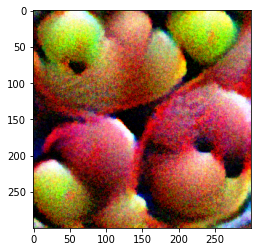

Running epoch 8: 100%|██████████| 31/31 [01:08<00:00,  1.69s/it]

Running epoch 8: 100%|██████████| 31/31 [01:08<00:00,  2.21s/it]


  EPOCH NR:  8
EPOCH LOSS:  tensor(0.9100, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5769893027121021
  NPS LOSS:  0.0005556419097457922
   TV LOSS:  0.3324440198559915
EPOCH TIME:  69.03502583503723


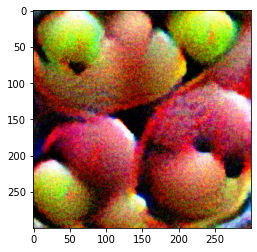

Running epoch 9: 100%|██████████| 31/31 [01:08<00:00,  1.70s/it]

Running epoch 9: 100%|██████████| 31/31 [01:09<00:00,  2.23s/it]


  EPOCH NR:  9
EPOCH LOSS:  tensor(0.9226, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5759208798408508
  NPS LOSS:  0.0005677819774005442
   TV LOSS:  0.34606337066619625
EPOCH TIME:  69.72670030593872


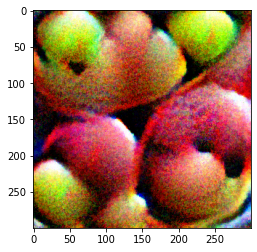

Running epoch 10: 100%|██████████| 31/31 [01:07<00:00,  1.70s/it]

Running epoch 10: 100%|██████████| 31/31 [01:08<00:00,  2.21s/it]


  EPOCH NR:  10
EPOCH LOSS:  tensor(0.9000, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5698656632054236
  NPS LOSS:  0.0005709941746787199
   TV LOSS:  0.32959969197550126
EPOCH TIME:  68.87768959999084


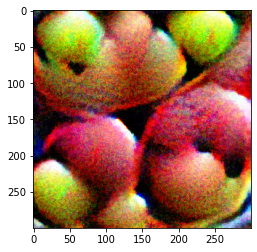

Running epoch 11: 100%|██████████| 31/31 [01:08<00:00,  1.70s/it]

Running epoch 11: 100%|██████████| 31/31 [01:08<00:00,  2.21s/it]


  EPOCH NR:  11
EPOCH LOSS:  tensor(0.8864, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5673596022590515
  NPS LOSS:  0.0005784197916997777
   TV LOSS:  0.31841921229516307
EPOCH TIME:  68.90603351593018


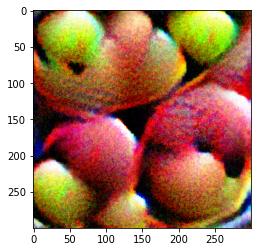

Running epoch 12: 100%|██████████| 31/31 [01:08<00:00,  1.69s/it]

Running epoch 12: 100%|██████████| 31/31 [01:08<00:00,  2.22s/it]


  EPOCH NR:  12
EPOCH LOSS:  tensor(0.9004, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5656038359288247
  NPS LOSS:  0.0005858783505015797
   TV LOSS:  0.3342447559679708
EPOCH TIME:  69.12945127487183


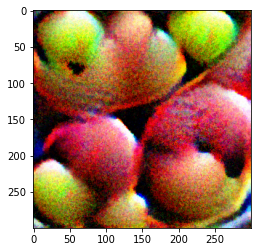

Running epoch 13: 100%|██████████| 31/31 [01:08<00:00,  1.69s/it]

Running epoch 13: 100%|██████████| 31/31 [01:08<00:00,  2.21s/it]


  EPOCH NR:  13
EPOCH LOSS:  tensor(0.8927, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5652841848711814
  NPS LOSS:  0.0005912799782480204
   TV LOSS:  0.32677528358274893
EPOCH TIME:  69.00593590736389


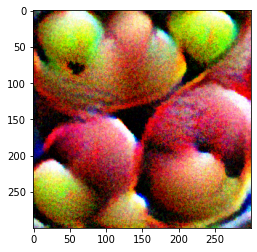

Running epoch 14: 100%|██████████| 31/31 [01:07<00:00,  1.69s/it]

Running epoch 14: 100%|██████████| 31/31 [01:07<00:00,  2.19s/it]


  EPOCH NR:  14
EPOCH LOSS:  tensor(0.8860, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5607266253040682
  NPS LOSS:  0.0005978121902913817
   TV LOSS:  0.3247230677835403
EPOCH TIME:  68.25428700447083


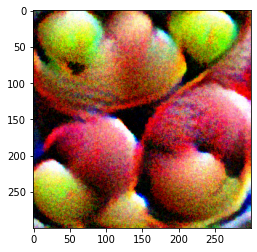

Running epoch 15: 100%|██████████| 31/31 [01:08<00:00,  1.70s/it]

Running epoch 15: 100%|██████████| 31/31 [01:08<00:00,  2.22s/it]


  EPOCH NR:  15
EPOCH LOSS:  tensor(0.8869, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5598973497267692
  NPS LOSS:  0.0006029515268070804
   TV LOSS:  0.32640730950140184
EPOCH TIME:  69.2355523109436


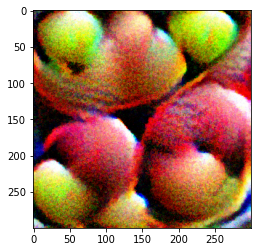

Running epoch 16: 100%|██████████| 31/31 [01:08<00:00,  1.69s/it]

Running epoch 16: 100%|██████████| 31/31 [01:08<00:00,  2.21s/it]


  EPOCH NR:  16
EPOCH LOSS:  tensor(0.8881, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5573869674436508
  NPS LOSS:  0.0006099515275338724
   TV LOSS:  0.3300532708244939
EPOCH TIME:  68.96324944496155


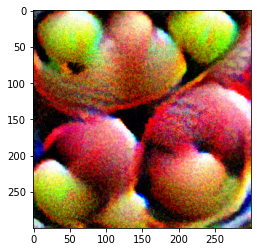

Running epoch 17: 100%|██████████| 31/31 [01:07<00:00,  1.68s/it]

Running epoch 17: 100%|██████████| 31/31 [01:08<00:00,  2.20s/it]


  EPOCH NR:  17
EPOCH LOSS:  tensor(0.8700, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5552870746581785
  NPS LOSS:  0.0006095550770330574
   TV LOSS:  0.3140950972034085
EPOCH TIME:  68.68583154678345


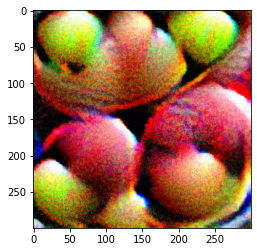

Running epoch 18: 100%|██████████| 31/31 [01:06<00:00,  1.67s/it]

Running epoch 18: 100%|██████████| 31/31 [01:07<00:00,  2.16s/it]


  EPOCH NR:  18
EPOCH LOSS:  tensor(0.8772, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5543641621066678
  NPS LOSS:  0.0006145556370968059
   TV LOSS:  0.32223482093503397
EPOCH TIME:  67.53034234046936


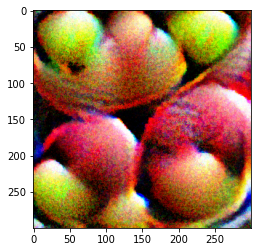

Running epoch 19: 100%|██████████| 31/31 [01:07<00:00,  1.67s/it]

Running epoch 19: 100%|██████████| 31/31 [01:07<00:00,  2.19s/it]


  EPOCH NR:  19
EPOCH LOSS:  tensor(0.8695, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5546724584794813
  NPS LOSS:  0.0006147769689109296
   TV LOSS:  0.31421969206102435
EPOCH TIME:  68.19080853462219


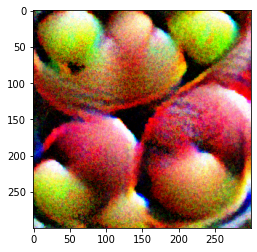

Running epoch 20: 100%|██████████| 31/31 [01:07<00:00,  1.67s/it]

Running epoch 20: 100%|██████████| 31/31 [01:07<00:00,  2.18s/it]


  EPOCH NR:  20
EPOCH LOSS:  tensor(0.8708, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5487438949846453
  NPS LOSS:  0.0006188462439533924
   TV LOSS:  0.3214458986636131
EPOCH TIME:  67.89993810653687


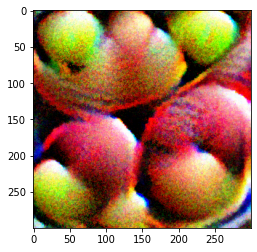

Running epoch 21: 100%|██████████| 31/31 [01:07<00:00,  1.68s/it]

Running epoch 21: 100%|██████████| 31/31 [01:08<00:00,  2.19s/it]


  EPOCH NR:  21
EPOCH LOSS:  tensor(0.8693, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5522314223550981
  NPS LOSS:  0.0006200809448566888
   TV LOSS:  0.3164480520832923
EPOCH TIME:  68.47573256492615


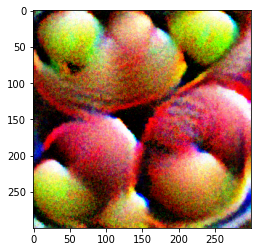

Running epoch 22: 100%|██████████| 31/31 [01:07<00:00,  1.67s/it]

Running epoch 22: 100%|██████████| 31/31 [01:07<00:00,  2.18s/it]


  EPOCH NR:  22
EPOCH LOSS:  tensor(0.8663, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5525053835684254
  NPS LOSS:  0.0006233929889276624
   TV LOSS:  0.3132179062212667
EPOCH TIME:  68.0921380519867


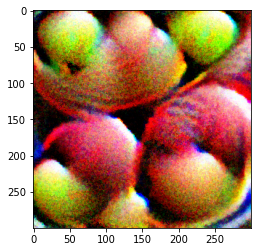

Running epoch 23: 100%|██████████| 31/31 [01:07<00:00,  1.67s/it]

Running epoch 23: 100%|██████████| 31/31 [01:08<00:00,  2.20s/it]


  EPOCH NR:  23
EPOCH LOSS:  tensor(0.8758, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5429517453716647
  NPS LOSS:  0.0006301451151469542
   TV LOSS:  0.33216996346750566
EPOCH TIME:  68.5974349975586


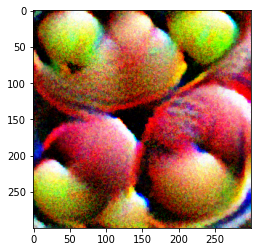

Running epoch 24: 100%|██████████| 31/31 [01:07<00:00,  1.68s/it]

Running epoch 24: 100%|██████████| 31/31 [01:07<00:00,  2.18s/it]


  EPOCH NR:  24
EPOCH LOSS:  tensor(0.8637, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.546710527712299
  NPS LOSS:  0.0006299664345269482
   TV LOSS:  0.3163390198061543
EPOCH TIME:  67.99127507209778


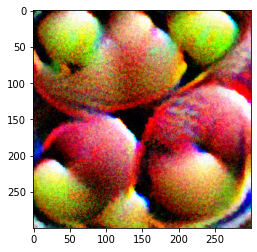

Running epoch 25: 100%|██████████| 31/31 [01:07<00:00,  1.68s/it]

Running epoch 25: 100%|██████████| 31/31 [01:07<00:00,  2.19s/it]


  EPOCH NR:  25
EPOCH LOSS:  tensor(0.8787, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5543151257499572
  NPS LOSS:  0.0006333290422785908
   TV LOSS:  0.32379388616931054
EPOCH TIME:  68.26320004463196


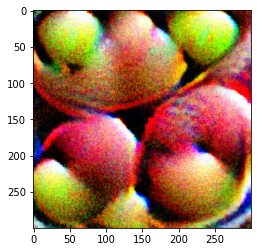

Running epoch 26: 100%|██████████| 31/31 [01:07<00:00,  1.67s/it]

Running epoch 26: 100%|██████████| 31/31 [01:07<00:00,  2.19s/it]


  EPOCH NR:  26
EPOCH LOSS:  tensor(0.8652, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5476411475289252
  NPS LOSS:  0.0006349532350507234
   TV LOSS:  0.31687654410639116
EPOCH TIME:  68.477041721344


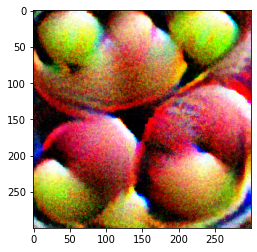

Running epoch 27: 100%|██████████| 31/31 [01:07<00:00,  1.68s/it]

Running epoch 27: 100%|██████████| 31/31 [01:07<00:00,  2.19s/it]


  EPOCH NR:  27
EPOCH LOSS:  tensor(0.8430, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5427609960879048
  NPS LOSS:  0.0006358247990119121
   TV LOSS:  0.2996054916612564
EPOCH TIME:  68.28824496269226


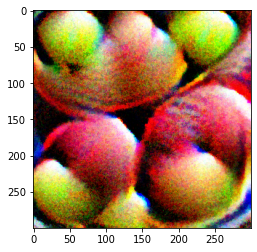

Running epoch 28: 100%|██████████| 31/31 [01:07<00:00,  1.67s/it]

Running epoch 28: 100%|██████████| 31/31 [01:07<00:00,  2.18s/it]


  EPOCH NR:  28
EPOCH LOSS:  tensor(0.8482, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5439614115222808
  NPS LOSS:  0.0006374333320455926
   TV LOSS:  0.30360509887818365
EPOCH TIME:  67.98596954345703


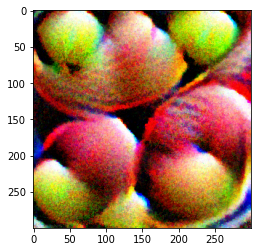

Running epoch 29: 100%|██████████| 31/31 [01:07<00:00,  1.68s/it]

Running epoch 29: 100%|██████████| 31/31 [01:07<00:00,  2.18s/it]


  EPOCH NR:  29
EPOCH LOSS:  tensor(0.8555, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5438232796807443
  NPS LOSS:  0.0006420877236392229
   TV LOSS:  0.31102404382921034
EPOCH TIME:  68.15375804901123


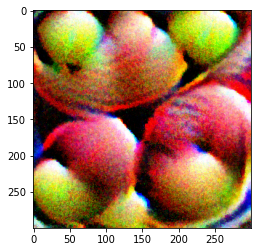

Running epoch 30: 100%|██████████| 31/31 [01:07<00:00,  1.67s/it]

Running epoch 30: 100%|██████████| 31/31 [01:07<00:00,  2.19s/it]


  EPOCH NR:  30
EPOCH LOSS:  tensor(0.8650, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5444312509029142
  NPS LOSS:  0.0006458196007917004
   TV LOSS:  0.31988049995514656
EPOCH TIME:  68.27992343902588


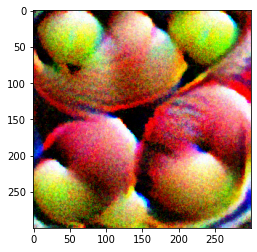

Running epoch 31: 100%|██████████| 31/31 [01:07<00:00,  1.68s/it]

Running epoch 31: 100%|██████████| 31/31 [01:07<00:00,  2.19s/it]


  EPOCH NR:  31
EPOCH LOSS:  tensor(0.8629, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5451961996093873
  NPS LOSS:  0.00064580014628929
   TV LOSS:  0.3170968572939596
EPOCH TIME:  68.31792378425598


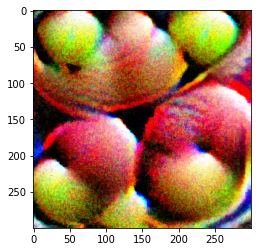

Running epoch 32: 100%|██████████| 31/31 [01:07<00:00,  1.69s/it]

Running epoch 32: 100%|██████████| 31/31 [01:07<00:00,  2.19s/it]


  EPOCH NR:  32
EPOCH LOSS:  tensor(0.8577, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.541384506610132
  NPS LOSS:  0.0006486435736259145
   TV LOSS:  0.31571605801582336
EPOCH TIME:  68.4010808467865


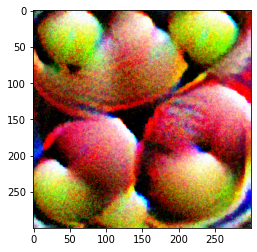

Running epoch 33: 100%|██████████| 31/31 [01:07<00:00,  1.68s/it]

Running epoch 33: 100%|██████████| 31/31 [01:08<00:00,  2.20s/it]


  EPOCH NR:  33
EPOCH LOSS:  tensor(0.8469, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5366237307748487
  NPS LOSS:  0.0006503651797350856
   TV LOSS:  0.30961877972848956
EPOCH TIME:  68.54110264778137


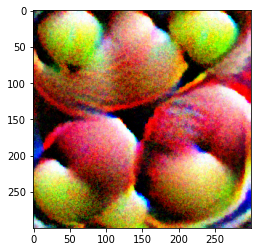

Running epoch 34: 100%|██████████| 31/31 [01:07<00:00,  1.67s/it]

Running epoch 34: 100%|██████████| 31/31 [01:08<00:00,  2.20s/it]


  EPOCH NR:  34
EPOCH LOSS:  tensor(0.8450, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5384448891685855
  NPS LOSS:  0.000651184418764446
   TV LOSS:  0.3058626632536611
EPOCH TIME:  68.63211154937744


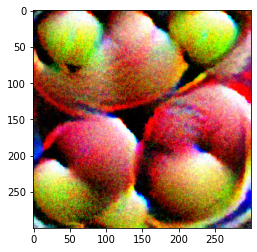

Running epoch 35: 100%|██████████| 31/31 [01:07<00:00,  1.68s/it]

Running epoch 35: 100%|██████████| 31/31 [01:07<00:00,  2.19s/it]


  EPOCH NR:  35
EPOCH LOSS:  tensor(0.8465, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5413000900899211
  NPS LOSS:  0.0006548573803757468
   TV LOSS:  0.3045450035602816
EPOCH TIME:  68.40651869773865


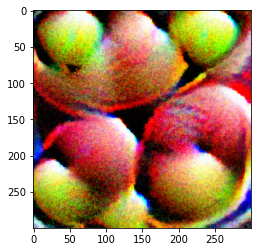

Running epoch 36:   0%|          | 0/31 [00:00<?, ?it/s]

In [ ]:
# Call patch_training_caller to generate a patch with starter image
# Your code starts here
%run train_patch.py base true

starting test read
img read!
One epoch is 31


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 10 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Running epoch 0:   0%|          | 0/31 [00:00<?, ?it/s]/content/drive/MyDrive/adversarial-yolo/train_patch.py:84: UserWarning: Anomaly Detection has been enabled. This mode will increase the runtime and should only be enabled for debugging.
  with autograd.detect_anomaly():
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4066: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of gri

Running epoch 0: 100%|██████████| 31/31 [01:37<00:00,  3.15s/it]


  EPOCH NR:  0
EPOCH LOSS:  tensor(0.9043, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6329274965870765
  NPS LOSS:  0.0003631640438764026
   TV LOSS:  0.27044724312520796
EPOCH TIME:  97.88869547843933


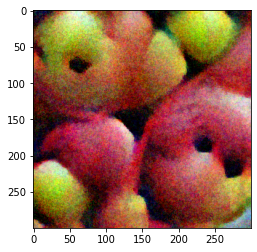

Running epoch 1: 100%|██████████| 31/31 [01:28<00:00,  2.28s/it]

Running epoch 1: 100%|██████████| 31/31 [01:28<00:00,  2.86s/it]


  EPOCH NR:  1
EPOCH LOSS:  tensor(0.9654, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6175126817918593
  NPS LOSS:  0.0004458119886206283
   TV LOSS:  0.3473947250073956
EPOCH TIME:  88.9370846748352


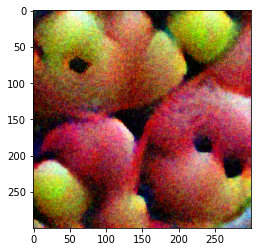

Running epoch 2: 100%|██████████| 31/31 [01:27<00:00,  2.26s/it]

Running epoch 2: 100%|██████████| 31/31 [01:27<00:00,  2.83s/it]


  EPOCH NR:  2
EPOCH LOSS:  tensor(0.9728, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6077648689669948
  NPS LOSS:  0.0004779633900691425
   TV LOSS:  0.3645329033174822
EPOCH TIME:  88.03761196136475


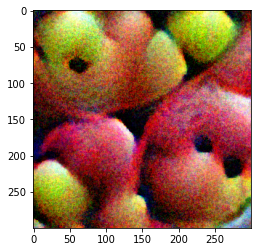

Running epoch 3: 100%|██████████| 31/31 [01:28<00:00,  2.28s/it]

Running epoch 3: 100%|██████████| 31/31 [01:28<00:00,  2.85s/it]


  EPOCH NR:  3
EPOCH LOSS:  tensor(0.9668, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.5992010005058781
  NPS LOSS:  0.0004998052646706421
   TV LOSS:  0.36712305680398016
EPOCH TIME:  88.78559803962708


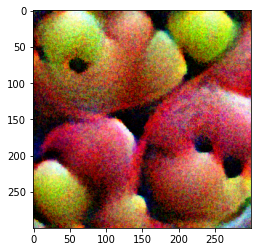

Running epoch 4: 100%|██████████| 31/31 [01:27<00:00,  2.26s/it]

Running epoch 4: 100%|██████████| 31/31 [01:27<00:00,  2.82s/it]

  EPOCH NR:  4
EPOCH LOSS:  tensor(0.9461, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.593722153094507
  NPS LOSS:  0.0005124535546788285
   TV LOSS:  0.35188321240486636
EPOCH TIME:  87.9422562122345


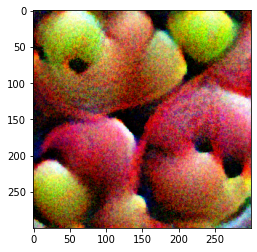

Running epoch 5:  94%|█████████▎| 29/31 [01:24<00:05,  2.91s/it]


KeyboardInterrupt: ignored

In [ ]:
# Call patch_training_caller to generate a patch without starter image
# Your code starts here
  %run train_patch.py base false

One epoch is 31


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 10 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))
Running epoch 0:   0%|          | 0/31 [00:00<?, ?it/s]/content/drive/MyDrive/adversarial-yolo/train_patch.py:84: UserWarning: Anomaly Detection has been enabled. This mode will increase the runtime and should only be enabled for debugging.
  with autograd.detect_anomaly():
/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:4066: UserWarning: Default grid_sample and affine_grid behavior has changed to align_corners=False since 1.3.0. Please specify align_corners=True if the old behavior is desired. See the documentation of gri

Running epoch 0: 100%|██████████| 31/31 [01:21<00:00,  2.63s/it]

  EPOCH NR:  0
EPOCH LOSS:  tensor(0.9896, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.7782220782772187
  NPS LOSS:  0.0005623196446967702
   TV LOSS:  0.21071360043941006
EPOCH TIME:  82.13790440559387


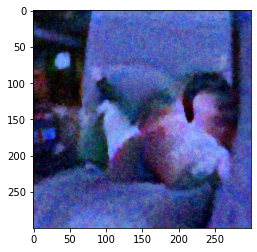

Running epoch 1: 100%|██████████| 31/31 [01:18<00:00,  2.03s/it]

Running epoch 1: 100%|██████████| 31/31 [01:18<00:00,  2.54s/it]


  EPOCH NR:  1
EPOCH LOSS:  tensor(1.0166, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.7408110364790885
  NPS LOSS:  0.0005835934895120802
   TV LOSS:  0.27521747639102323
EPOCH TIME:  79.09136867523193


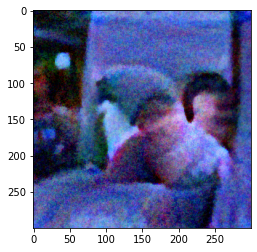

Running epoch 2: 100%|██████████| 31/31 [01:18<00:00,  2.02s/it]

Running epoch 2: 100%|██████████| 31/31 [01:18<00:00,  2.53s/it]


  EPOCH NR:  2
EPOCH LOSS:  tensor(1.0278, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.7236543855359477
  NPS LOSS:  0.0005890180022575923
   TV LOSS:  0.30355251412237844
EPOCH TIME:  79.0287082195282


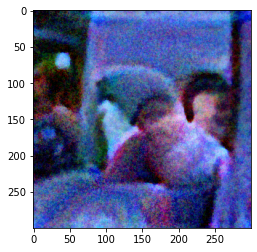

Running epoch 3: 100%|██████████| 31/31 [01:18<00:00,  2.02s/it]

Running epoch 3: 100%|██████████| 31/31 [01:18<00:00,  2.54s/it]


  EPOCH NR:  3
EPOCH LOSS:  tensor(1.0344, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.7110202850834015
  NPS LOSS:  0.0005920101332688524
   TV LOSS:  0.3227813080433876
EPOCH TIME:  79.25617480278015


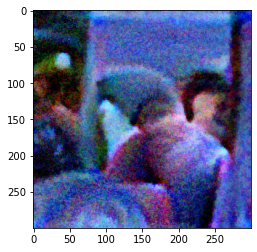

Running epoch 4: 100%|██████████| 31/31 [01:17<00:00,  2.02s/it]

Running epoch 4: 100%|██████████| 31/31 [01:17<00:00,  2.51s/it]


  EPOCH NR:  4
EPOCH LOSS:  tensor(1.0344, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6979948628333307
  NPS LOSS:  0.0005901218504614888
   TV LOSS:  0.33584809207147165
EPOCH TIME:  79.0213143825531


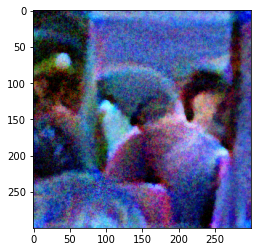

Running epoch 5: 100%|██████████| 31/31 [01:18<00:00,  2.02s/it]

Running epoch 5: 100%|██████████| 31/31 [01:19<00:00,  2.55s/it]


  EPOCH NR:  5
EPOCH LOSS:  tensor(1.0314, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6957595809813468
  NPS LOSS:  0.0005853623339545823
   TV LOSS:  0.3350965976715088
EPOCH TIME:  79.46322178840637


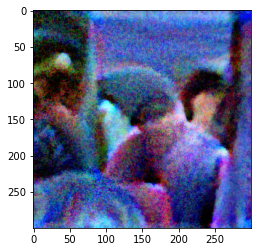

Running epoch 6: 100%|██████████| 31/31 [01:17<00:00,  2.02s/it]

Running epoch 6: 100%|██████████| 31/31 [01:18<00:00,  2.52s/it]


  EPOCH NR:  6
EPOCH LOSS:  tensor(0.9993, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6902286391104421
  NPS LOSS:  0.0005766499952803697
   TV LOSS:  0.3084697444592753
EPOCH TIME:  78.8053412437439


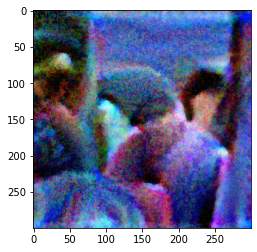

Running epoch 7: 100%|██████████| 31/31 [01:17<00:00,  2.03s/it]

Running epoch 7: 100%|██████████| 31/31 [01:18<00:00,  2.52s/it]


  EPOCH NR:  7
EPOCH LOSS:  tensor(1.0028, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6859530460449957
  NPS LOSS:  0.0005723747815335951
   TV LOSS:  0.3162923907080004
EPOCH TIME:  78.6957037448883


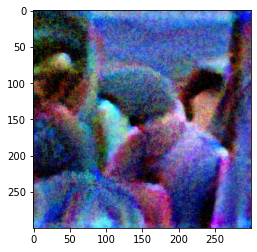

Running epoch 8: 100%|██████████| 31/31 [01:17<00:00,  2.02s/it]

Running epoch 8: 100%|██████████| 31/31 [01:18<00:00,  2.52s/it]


  EPOCH NR:  8
EPOCH LOSS:  tensor(0.9978, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6810857288299068
  NPS LOSS:  0.0005683702146334033
   TV LOSS:  0.3161295671616831
EPOCH TIME:  78.73326063156128


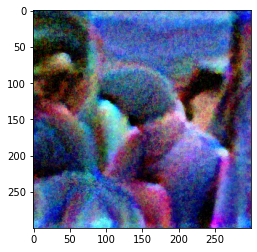

Running epoch 9: 100%|██████████| 31/31 [01:18<00:00,  2.02s/it]

Running epoch 9: 100%|██████████| 31/31 [01:18<00:00,  2.55s/it]


  EPOCH NR:  9
EPOCH LOSS:  tensor(0.9755, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6787241235856087
  NPS LOSS:  0.0005598101134021436
   TV LOSS:  0.2961814297783759
EPOCH TIME:  79.43503141403198


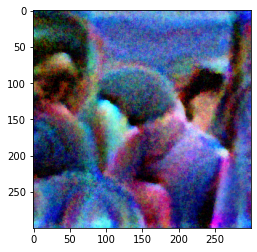

Running epoch 10: 100%|██████████| 31/31 [01:18<00:00,  2.02s/it]

Running epoch 10: 100%|██████████| 31/31 [01:19<00:00,  2.56s/it]


  EPOCH NR:  10
EPOCH LOSS:  tensor(0.9702, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6734798646742298
  NPS LOSS:  0.0005561790425300358
   TV LOSS:  0.29615705051729757
EPOCH TIME:  79.80188965797424


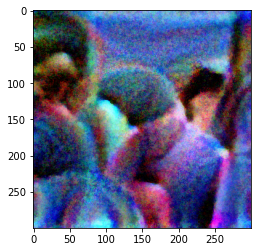

Running epoch 11: 100%|██████████| 31/31 [01:18<00:00,  2.03s/it]

Running epoch 11: 100%|██████████| 31/31 [01:18<00:00,  2.55s/it]


  EPOCH NR:  11
EPOCH LOSS:  tensor(0.9801, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.672109846145876
  NPS LOSS:  0.0005541026588499306
   TV LOSS:  0.30740012853376325
EPOCH TIME:  79.45842432975769


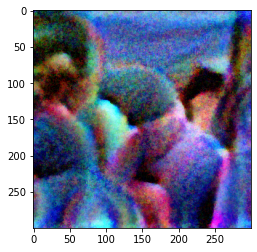

Running epoch 12: 100%|██████████| 31/31 [01:18<00:00,  2.03s/it]

Running epoch 12: 100%|██████████| 31/31 [01:18<00:00,  2.53s/it]


  EPOCH NR:  12
EPOCH LOSS:  tensor(0.9662, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6700909714544973
  NPS LOSS:  0.0005477607914907557
   TV LOSS:  0.2955425199001066
EPOCH TIME:  79.000159740448


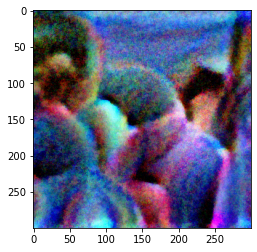

Running epoch 13: 100%|██████████| 31/31 [01:18<00:00,  2.02s/it]

Running epoch 13: 100%|██████████| 31/31 [01:18<00:00,  2.55s/it]


  EPOCH NR:  13
EPOCH LOSS:  tensor(0.9637, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6688400122427172
  NPS LOSS:  0.0005441403200459336
   TV LOSS:  0.29429608102767696
EPOCH TIME:  79.45906162261963


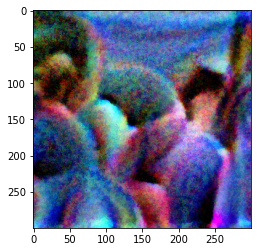

Running epoch 14: 100%|██████████| 31/31 [01:19<00:00,  2.02s/it]

Running epoch 14: 100%|██████████| 31/31 [01:19<00:00,  2.57s/it]


  EPOCH NR:  14
EPOCH LOSS:  tensor(0.9594, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6681989700563492
  NPS LOSS:  0.0005395196044006415
   TV LOSS:  0.29065433913661587
EPOCH TIME:  80.09312391281128


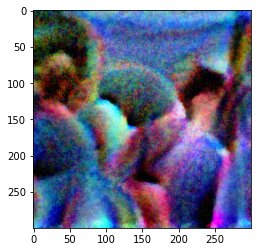

Running epoch 15: 100%|██████████| 31/31 [01:18<00:00,  2.03s/it]

Running epoch 15: 100%|██████████| 31/31 [01:19<00:00,  2.56s/it]


  EPOCH NR:  15
EPOCH LOSS:  tensor(0.9782, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6655618586847859
  NPS LOSS:  0.0005399040528573096
   TV LOSS:  0.3121223920775998
EPOCH TIME:  79.77567291259766


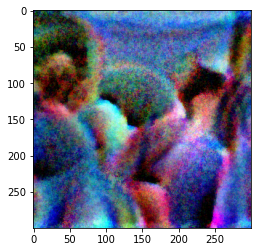

Running epoch 16: 100%|██████████| 31/31 [01:18<00:00,  2.03s/it]

Running epoch 16: 100%|██████████| 31/31 [01:19<00:00,  2.55s/it]


  EPOCH NR:  16
EPOCH LOSS:  tensor(0.9766, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6673145101916406
  NPS LOSS:  0.0005371152806366163
   TV LOSS:  0.3087712526321411
EPOCH TIME:  79.52951622009277


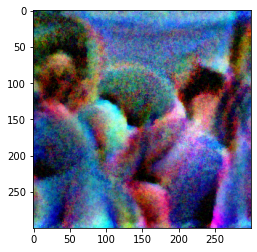

Running epoch 17: 100%|██████████| 31/31 [01:18<00:00,  2.02s/it]

Running epoch 17: 100%|██████████| 31/31 [01:18<00:00,  2.55s/it]


  EPOCH NR:  17
EPOCH LOSS:  tensor(0.9647, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6662241605020338
  NPS LOSS:  0.0005318639262939894
   TV LOSS:  0.29794818739737233
EPOCH TIME:  79.47384119033813


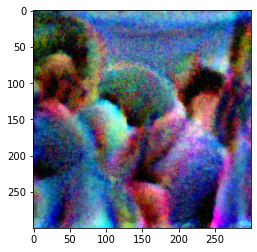

Running epoch 18: 100%|██████████| 31/31 [01:18<00:00,  2.03s/it]

Running epoch 18: 100%|██████████| 31/31 [01:18<00:00,  2.55s/it]


  EPOCH NR:  18
EPOCH LOSS:  tensor(0.9549, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6618644422100436
  NPS LOSS:  0.000528209146127225
   TV LOSS:  0.29246146159787334
EPOCH TIME:  79.4853458404541


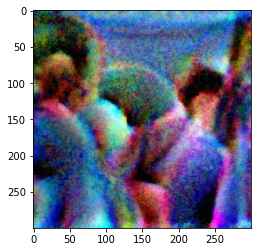

Running epoch 19: 100%|██████████| 31/31 [01:18<00:00,  2.03s/it]

Running epoch 19: 100%|██████████| 31/31 [01:19<00:00,  2.56s/it]


  EPOCH NR:  19
EPOCH LOSS:  tensor(0.9560, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.659980345156885
  NPS LOSS:  0.0005282097469804989
   TV LOSS:  0.29550464595517806
EPOCH TIME:  79.88302540779114


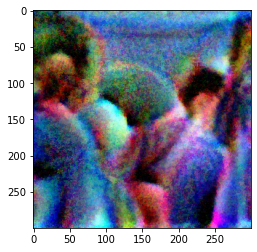

Running epoch 20: 100%|██████████| 31/31 [01:19<00:00,  2.03s/it]

Running epoch 20: 100%|██████████| 31/31 [01:19<00:00,  2.57s/it]


  EPOCH NR:  20
EPOCH LOSS:  tensor(0.9590, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6607646634501796
  NPS LOSS:  0.0005264858088095582
   TV LOSS:  0.29771456314671424
EPOCH TIME:  80.07007932662964


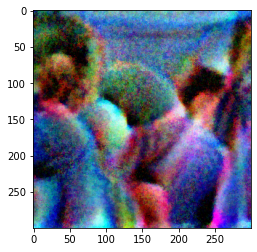

Running epoch 21: 100%|██████████| 31/31 [01:18<00:00,  2.02s/it]

Running epoch 21: 100%|██████████| 31/31 [01:19<00:00,  2.55s/it]


  EPOCH NR:  21
EPOCH LOSS:  tensor(0.9608, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.66075373272742
  NPS LOSS:  0.0005249101274286306
   TV LOSS:  0.2995387411886646
EPOCH TIME:  79.73568773269653


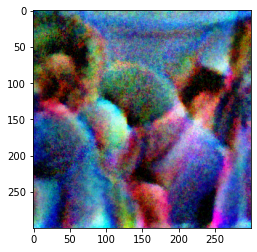

Running epoch 22: 100%|██████████| 31/31 [01:19<00:00,  2.02s/it]

Running epoch 22: 100%|██████████| 31/31 [01:19<00:00,  2.56s/it]


  EPOCH NR:  22
EPOCH LOSS:  tensor(0.9635, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6577796916807851
  NPS LOSS:  0.0005249423331641142
   TV LOSS:  0.30520124973789337
EPOCH TIME:  80.02490162849426


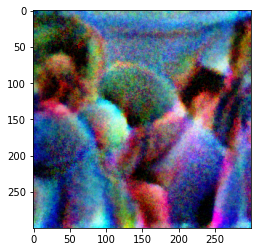

Running epoch 23: 100%|██████████| 31/31 [01:19<00:00,  2.03s/it]

Running epoch 23: 100%|██████████| 31/31 [01:19<00:00,  2.56s/it]


  EPOCH NR:  23
EPOCH LOSS:  tensor(0.9486, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6588504314422607
  NPS LOSS:  0.0005204101232060742
   TV LOSS:  0.2891871929168701
EPOCH TIME:  80.01014232635498


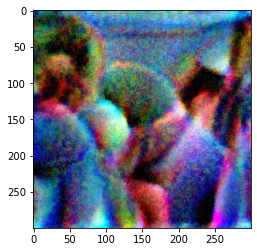

Running epoch 24: 100%|██████████| 31/31 [01:18<00:00,  2.02s/it]

Running epoch 24: 100%|██████████| 31/31 [01:19<00:00,  2.56s/it]


  EPOCH NR:  24
EPOCH LOSS:  tensor(0.9651, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.657920616288339
  NPS LOSS:  0.0005233135701517665
   TV LOSS:  0.30665883037351793
EPOCH TIME:  79.78832077980042


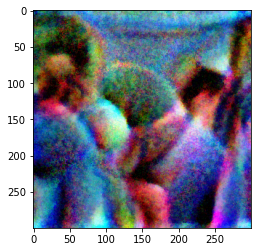

Running epoch 25: 100%|██████████| 31/31 [01:18<00:00,  2.02s/it]

Running epoch 25: 100%|██████████| 31/31 [01:19<00:00,  2.55s/it]


  EPOCH NR:  25
EPOCH LOSS:  tensor(0.9554, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6561632002553632
  NPS LOSS:  0.0005226756611298169
   TV LOSS:  0.2987500371471528
EPOCH TIME:  79.73197770118713


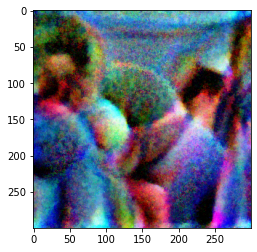

Running epoch 26: 100%|██████████| 31/31 [01:18<00:00,  2.03s/it]

Running epoch 26: 100%|██████████| 31/31 [01:18<00:00,  2.54s/it]


  EPOCH NR:  26
EPOCH LOSS:  tensor(0.9405, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.655960048398664
  NPS LOSS:  0.0005207852546816632
   TV LOSS:  0.2840550455354875
EPOCH TIME:  80.13524270057678


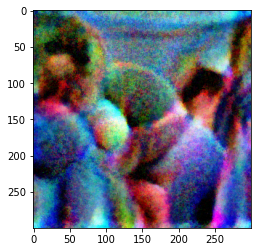

Running epoch 27: 100%|██████████| 31/31 [01:19<00:00,  2.03s/it]

Running epoch 27: 100%|██████████| 31/31 [01:19<00:00,  2.57s/it]


  EPOCH NR:  27
EPOCH LOSS:  tensor(0.9545, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6541667234513068
  NPS LOSS:  0.0005238501903330607
   TV LOSS:  0.29976828444388604
EPOCH TIME:  80.13817119598389


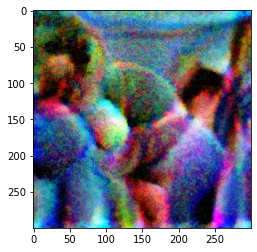

Running epoch 28: 100%|██████████| 31/31 [01:19<00:00,  2.03s/it]

Running epoch 28: 100%|██████████| 31/31 [01:19<00:00,  2.57s/it]


  EPOCH NR:  28
EPOCH LOSS:  tensor(0.9576, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6522177380900229
  NPS LOSS:  0.0005232701096833954
   TV LOSS:  0.30481280338379646
EPOCH TIME:  80.1854944229126


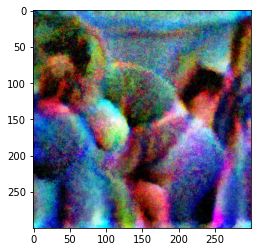

Running epoch 29: 100%|██████████| 31/31 [01:19<00:00,  2.03s/it]

Running epoch 29: 100%|██████████| 31/31 [01:19<00:00,  2.57s/it]


  EPOCH NR:  29
EPOCH LOSS:  tensor(0.9479, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6503616917517877
  NPS LOSS:  0.0005206931063214377
   TV LOSS:  0.2970327869538338
EPOCH TIME:  80.3650631904602


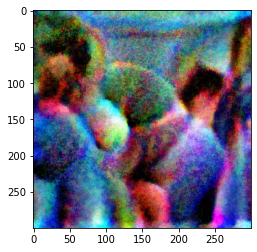

Running epoch 30: 100%|██████████| 31/31 [01:19<00:00,  2.03s/it]

Running epoch 30: 100%|██████████| 31/31 [01:19<00:00,  2.57s/it]


  EPOCH NR:  30
EPOCH LOSS:  tensor(0.9482, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6530208645328399
  NPS LOSS:  0.0005213140018074023
   TV LOSS:  0.29469067819656863
EPOCH TIME:  80.06790041923523


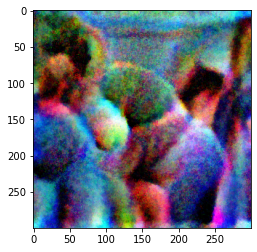

Running epoch 31: 100%|██████████| 31/31 [01:19<00:00,  2.03s/it]

Running epoch 31: 100%|██████████| 31/31 [01:19<00:00,  2.58s/it]


  EPOCH NR:  31
EPOCH LOSS:  tensor(0.9574, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6517591418758515
  NPS LOSS:  0.0005223547040875401
   TV LOSS:  0.3051267900774556
EPOCH TIME:  80.41935682296753


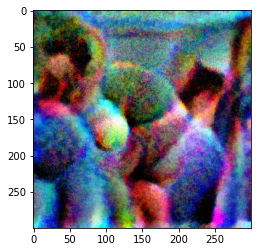

Running epoch 32: 100%|██████████| 31/31 [01:18<00:00,  2.03s/it]

Running epoch 32: 100%|██████████| 31/31 [01:19<00:00,  2.56s/it]


  EPOCH NR:  32
EPOCH LOSS:  tensor(0.9672, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.650020920461224
  NPS LOSS:  0.0005276326311662072
   TV LOSS:  0.31668748970954647
EPOCH TIME:  79.95391750335693


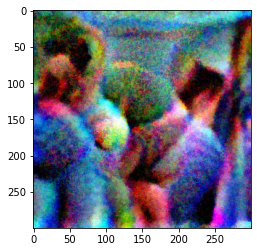

Running epoch 33: 100%|██████████| 31/31 [01:18<00:00,  2.03s/it]

Running epoch 33: 100%|██████████| 31/31 [01:19<00:00,  2.55s/it]


  EPOCH NR:  33
EPOCH LOSS:  tensor(0.9558, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6480704199883246
  NPS LOSS:  0.0005245668768522239
   TV LOSS:  0.3072151897415038
EPOCH TIME:  79.7717387676239


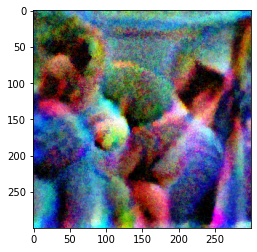

Running epoch 34: 100%|██████████| 31/31 [01:18<00:00,  2.03s/it]

Running epoch 34: 100%|██████████| 31/31 [01:18<00:00,  2.55s/it]


  EPOCH NR:  34
EPOCH LOSS:  tensor(0.9708, device='cuda:0', grad_fn=<DivBackward0>)
  DET LOSS:  0.6459016126971091
  NPS LOSS:  0.0005293220371728944
   TV LOSS:  0.3243285744420944
EPOCH TIME:  79.60651683807373


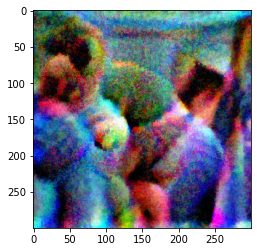

Running epoch 35:   3%|▎         | 1/31 [00:13<06:45, 13.53s/it]


KeyboardInterrupt: ignored

In [ ]:
  %run train_patch.py base true

In [ ]:
  %run test_hide.py human IMG_0158.MOV

Video to frame conversion finished.
Recognizing objects in frame0.jpg


RuntimeError: ignored

### (3) Detect people with patches
Use the same api in detect.py as section 2.1 (1) to detect people who hold the patch picture you generated in 2.1 (2). The model should not recognize the people in this case. 


In [ ]:
# Your code starts here

## 2.2 Attack Stop Signs-Detection

### (1) Detect without patch
Similar to 2.1 (1), first we need to use apis in detect.py to recognize images of stop signs.

In [ ]:
# Your code starts here

## (2) Patch stop signs
* Edit the source code involved in the patch-sticking control flow to attach the patch image on all the stop sign images. Images belonging to any other class (i.e. people, horses, etc.) should not be patched.
* Write a wrapped-up api for sticking patches on stop signs.
* Call the api to stick patch on stop sign. You should specify which patch is used in parameter.


In [ ]:
def patch_sticking_caller(patch_img, ...):
  # If there's no stop sign in the image, the image should not be patched.
  # Your code starts here

In [ ]:
# Call patch_sticking_caller to stick a patch on stop sign image. 
# Your code starts here

### (3) Detect stop sign with patch
Use the same api in detect.py as section 2.2 (1) to detect the patched stop sign. The model should not recognize the stop sign in this case. 

In [ ]:
# Your code starts here